In [1]:
import numpy as np
import pandas as pd
import scipy.io as sio
import matplotlib
import matplotlib.pyplot as plt
from numpy.matlib import repmat
from sklearn.preprocessing import normalize

import seaborn as sns

%matplotlib inline

In [2]:
df = pd.read_csv("encoded_smartphone_data.csv")

### Data Visualization

In [3]:
df

,Unnamed: 0,Brand,Model,Added,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,0,ZTE,Blade 20 Smart Global TD-LTE 128GB,1/1/2020 12:55,76.6,162.91,8.95,111686.20870,14,0,...,0,0,0,0,0,0,1,0,0,1
1,1,Samsung,SM-G6200 Galaxy A6s Dual SIM TD-LTE CN 128GB,11/7/2018 22:32,76.5,156.30,8.40,100438.38000,21,0,...,0,0,0,0,0,0,1,0,0,1
2,2,LG,LMV450VMB V50 ThinQ 5G TD-LTE US V450VMB,3/5/2019 23:31,76.1,159.20,8.30,100555.49600,20,0,...,0,0,0,1,0,0,0,1,0,0
3,3,Huawei,Y5 Lite 2018 Dual SIM LTE LATAM CAG-LX3 / CAG-L23,5/10/2018 20:11,73.7,145.10,9.45,101057.07150,12,0,...,0,0,0,0,0,0,1,0,0,1
4,4,Nokia,4.2 Dual SIM TD-LTE AM 32GB,8/14/2019 15:07,71.3,148.95,8.39,89102.93265,21,0,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,13938,Samsung,SGH-i780,9/22/2007 23:57,61.3,115.90,12.90,91650.24300,4,0,...,0,0,0,0,0,0,1,1,0,0
13565,13939,Vodafone,VPA Compact GPS,1/31/2007 13:51,58.2,108.00,18.40,115655.04000,7,0,...,0,0,0,0,0,0,1,1,0,0
13566,13940,E-TEN,InfoTouch P603,4/3/2005 18:03,82.0,137.40,18.40,207309.12000,3,0,...,0,0,0,0,0,0,1,1,0,0
13567,13941,Airis,T482,8/15/2008 18:05,62.0,125.00,14.00,108500.00000,4,0,...,0,0,0,0,0,0,1,1,0,0


In [4]:
df.shape

(13569, 153)

In [5]:
df = df.drop(labels=['Unnamed: 0', 'Brand', 'Model', 'Added'], axis=1)
df.head()

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


### K-Means

In [6]:
def plotCurrent(X, Rnk, Kmus):
    N, D = np.shape(X)
    K = np.shape(Kmus)[0]

    InitColorMat = np.matrix([[1, 0, 0], 
                              [0, 1, 0],   
                              [0, 0, 1],
                              [0, 0, 0],
                              [1, 1, 0], 
                              [1, 0, 1], 
                              [0, 1, 1]])

    KColorMat = InitColorMat[0:K]
    colorVec = Rnk.dot(KColorMat)
    muColorVec = np.eye(K).dot(KColorMat)

    plt.scatter(X[:,0], X[:,1], edgecolors=colorVec, marker='o', facecolors='none', alpha=0.3)
    plt.scatter(Kmus[:,0], Kmus[:,1], c=muColorVec, marker='D', s=50);

In [7]:
def calcSqDistances(X, Kmus):
    sqDmat = []
    for mean in Kmus:
        norm_array = []
        for point in X:
            norm_array.append(np.linalg.norm(point - mean))
        sqDmat.append(norm_array)
    return np.array(sqDmat).T

In [8]:
def determineRnk(sqDmat):
    mean_rank = []
    for i in sqDmat:
        cluster_val = []
        for j in i: 
            closest = i.min()
            if j == closest:
                cluster_val.append(1)
            else: 
                cluster_val.append(0)
        mean_rank.append(cluster_val)
        
    return np.array(mean_rank)

In [9]:
def recalcMus(X, Rnk):
    N = np.shape(X)[0]#13569
    k = np.shape(Rnk)[1] #2
    
    
    Kmus = np.empty(shape=(k,np.shape(X)[1]),dtype='object')
    
    for i in range(k):#0-1
        cluster_sum = np.zeros(np.shape(X)[1])
        count = 0
        
        for j in range(N): #from 0-13568
            cluster_sum = cluster_sum + Rnk[j][i]*X[j]
            count += Rnk[j][i]
        
        Kmus[i] = cluster_sum/count ##gives the actual means 
        #Kmus.insert(Kmus, i, (cluster_sum/count))
        #np.put(Kmus,i, (cluster_sum/count)) ### this is producing the error 
    
    return Kmus

In [10]:
def runKMeans(K, csv_filepath):
    # Load cleaned data in
    data = pd.read_csv(csv_filepath)
    
    ##break the columns into lists of their own and combine then into one array
    #x_col = data[X_col]
    #y_col = data[Y_col]
    #dimensions = []
    
    #for num in range(0,len(data[X_col])):
        #dimensions.append([x_col[num], y_col[num]])
    
    #dimensions = np.array(dimensions)
    
    #X = dimensions 
    X = data.drop(['Unnamed: 0', 'Brand', 'Model', 'Added'], axis = 1)
    X = np.array(X)
    
    # Determine and store data set information; N is the number of objects, D is the number of attributes
    N,D = X.shape

    # Allocate space for the K mu vectors
    Kmus = np.zeros((K, D))
    
    # Initialize cluster centers by randomly picking points from the data
    rndinds = np.random.permutation(N)
    Kmus = X[rndinds[:K]];
    
    # Specify the maximum number of iterations to allow
    maxiters = 1000;

    for iter in range(maxiters):
        # Assign each data vector to closest mu vector 
        # Do this by first calculating a squared distance matrix where the n,k entry
        # contains the squared distance from the nth data vector to the kth mu vector

        # sqDmat will be an N-by-K matrix with the n,k entry as specfied above
        
        sqDmat = calcSqDistances(X, Kmus);
        
        # given the matrix of squared distances, determine the closest cluster center for each data vector 

        # R is the "responsibility" matrix
        # R will be an N-by-K matrix of binary values whose n,k entry is set as 
        # Specifically, the n,k entry is 1 if point n is closest to cluster k,
        # and is 0 otherwise
        Rnk = determineRnk(sqDmat)
        
        KmusOld = Kmus
        #plotCurrent(X, Rnk, Kmus)
        #plt.show()

        # Recalculate mu values based on cluster assignments
        Kmus = recalcMus(X, Rnk)

        # If old cluster means are relatively close to the new cluster means,then break.
        if sum(abs(KmusOld.flatten() - Kmus.flatten())) < 1e-6:
            break

#     plotCurrent(X,Rnk,Kmus)
    
    rnk = Rnk.tolist()
    
    rank = []

    for i in rnk:
        idx = i.index(1)
        idx = idx + 1
        rank.append(idx)
                
    print(rank)
        
#     print(rnk)
    data['Rank'] = rank
#     print(type(data))
    return data

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

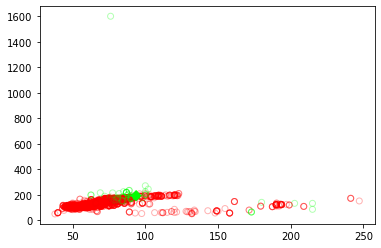

In [11]:
clusters2 = runKMeans(2,"encoded_smartphone_data.csv")

### PCA From Scratch

In [12]:
#source: https://www.askpython.com/python/examples/principal-component-analysis
def PCA_scratch(X , num_components):
     
    #Center the mean
    X_meaned = X - np.mean(X , axis = 0)
     
    #Calculate the covariance matrix 
    cov_mat = np.cov(X_meaned , rowvar = False)
     
    #calculate the eigenvectors and eigenvalues using the covariance matrix
    eigen_values , eigen_vectors = np.linalg.eigh(cov_mat)
     
    #sort the eigenvectors and eigenvalues
    sorted_index = np.argsort(eigen_values)[::-1]
    sorted_eigenvalue = eigen_values[sorted_index]
    sorted_eigenvectors = eigen_vectors[:,sorted_index]
    
    print("sorted eigenvectors \n", sorted_eigenvectors)
     
    #select the number of principal components as a subset from the eigenvalue matrix
    eigenvector_subset = sorted_eigenvectors[:,0:num_components]
     
    #transform the data and project onto lower dimensions
    X_reduced = np.dot(eigenvector_subset.transpose() , X_meaned.transpose() ).transpose()
    print("\n shape of X_reduced:", X_reduced.shape)
     
    return X_reduced

In [13]:
pca_applied = PCA_scratch(df.iloc[:, 0:149], 2)

sorted eigenvectors 
 [[ 7.52688630e-05 -2.16951063e-01  9.61992518e-01 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.05993577e-04 -9.45938614e-01 -2.47176666e-01 ... -1.03544162e-15
  -6.72940323e-15  5.02621219e-11]
 [ 5.39263273e-05  1.06289173e-01 -9.09597224e-02 ...  1.41046074e-14
   1.23298699e-13  2.00936154e-09]
 ...
 [ 3.74139118e-07  1.55866695e-03 -3.33381154e-03 ... -1.01474149e-01
   3.26299483e-02 -2.62486097e-02]
 [ 4.13110069e-08  2.96482942e-04 -1.14176990e-04 ... -1.01474149e-01
   3.26299483e-02 -2.62486864e-02]
 [-4.15450124e-07 -1.85514989e-03  3.44798853e-03 ... -1.01474149e-01
   3.26299483e-02 -2.62486027e-02]]

 shape of X_reduced: (13569, 2)


In [14]:
principal_components = pd.DataFrame(pca_applied, columns=['PC1', 'PC2'])
principal_components

,PC1,PC2
0,10846.172679,-20.068575
1,-401.656729,-16.553268
2,-284.540441,-19.026948
3,217.033531,-3.219527
4,-11737.105134,-9.699153
...,...,...
13564,-9189.798615,28.199012
13565,14814.997338,38.889680
13566,106469.081381,16.701516
13567,7659.959297,21.395550


In [15]:
df.head()

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [16]:
clusters2["Rank"]

0        1
1        1
2        1
3        1
4        1
        ..
13564    1
13565    1
13566    1
13567    1
13568    1
Name: Rank, Length: 13569, dtype: int64

In [17]:
principal_components

,PC1,PC2
0,10846.172679,-20.068575
1,-401.656729,-16.553268
2,-284.540441,-19.026948
3,217.033531,-3.219527
4,-11737.105134,-9.699153
...,...,...
13564,-9189.798615,28.199012
13565,14814.997338,38.889680
13566,106469.081381,16.701516
13567,7659.959297,21.395550


In [18]:
rank = pd.DataFrame(clusters2["Rank"])
rank

,Rank
0,1
1,1
2,1
3,1
4,1
...,...
13564,1
13565,1
13566,1
13567,1


In [19]:
type(rank)

pandas.core.frame.DataFrame

In [20]:
principal_df = pd.concat([principal_components, rank], axis=1)
principal_df

,PC1,PC2,Rank
0,10846.172679,-20.068575,1
1,-401.656729,-16.553268,1
2,-284.540441,-19.026948,1
3,217.033531,-3.219527,1
4,-11737.105134,-9.699153,1
...,...,...,...
13564,-9189.798615,28.199012,1
13565,14814.997338,38.889680,1
13566,106469.081381,16.701516,1
13567,7659.959297,21.395550,1


In [21]:
import seaborn as sb
import matplotlib.pyplot as plt

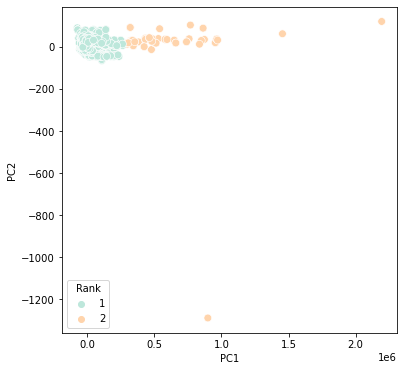

In [22]:
plt.figure(figsize = (6,6))
sb.scatterplot(data = principal_df, x='PC1', y='PC2', hue= 'Rank', s=60, palette='icefire')
plt.show()

### PCA with Standardized Data

In [23]:
import plotly.express as px
from sklearn.preprocessing import StandardScaler

In [24]:
#standardized df first. then call pca
df_std = StandardScaler().fit_transform(df)
df_std

array([[ 0.41242994,  0.94045379, -0.28238669, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.40422248,  0.64342397, -0.41266869, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.37139264,  0.77373963, -0.43635633, ...,  1.17869806,
        -0.12598344, -1.14164096],
       ...,
       [ 0.85563274, -0.2058746 ,  1.95609499, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.78585911, -0.76308636,  0.91383897, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.15388475, -1.12257782,  1.86134444, ...,  1.17869806,
        -0.12598344, -1.14164096]])

In [25]:
pca_applied_std = PCA_scratch(df_std[:,0:148], 2)

sorted eigenvectors 
 [[-8.59552558e-02 -6.87811561e-02  8.30559069e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.66363075e-01 -1.05788636e-01  4.31707378e-02 ...  8.81788602e-17
  -4.87133153e-16 -1.38472993e-16]
 [ 1.39021248e-01  2.40978028e-01  5.46654413e-02 ...  4.76805995e-16
   8.41841739e-17 -2.96143879e-16]
 ...
 [ 1.56479595e-01 -1.04495246e-01 -2.91856402e-01 ...  9.19431879e-02
  -3.18289519e-02 -4.41037966e-02]
 [-4.01584067e-02  9.96987712e-02 -7.82993341e-02 ... -3.98986399e-17
  -1.98625838e-16 -1.17906986e-16]
 [ 3.61215721e-02  2.54899066e-02  2.36954347e-02 ...  6.93889390e-17
  -1.56125113e-17 -5.68121938e-17]]

 shape of X_reduced: (13569, 2)


In [26]:
principal_components_std = pd.DataFrame(pca_applied_std, columns=['PC1', 'PC2'])
principal_components_std

,PC1,PC2
0,-2.033644,-1.643280
1,-0.640456,-1.832562
2,-9.059603,3.463313
3,1.694999,-1.918250
4,-1.042484,-1.173937
...,...,...
13564,3.645143,3.574368
13565,4.101689,5.732306
13566,4.584440,9.126374
13567,4.865653,6.761749


In [27]:
principal_df_std = pd.concat([principal_components_std, rank], axis=1)
principal_df_std

,PC1,PC2,Rank
0,-2.033644,-1.643280,1
1,-0.640456,-1.832562,1
2,-9.059603,3.463313,1
3,1.694999,-1.918250,1
4,-1.042484,-1.173937,1
...,...,...,...
13564,3.645143,3.574368,1
13565,4.101689,5.732306,1
13566,4.584440,9.126374,1
13567,4.865653,6.761749,1


## PCA Visualization

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

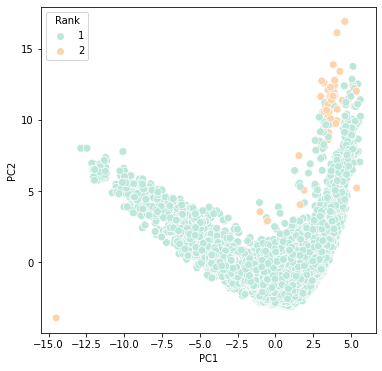

In [28]:
plt.figure(figsize = (6,6))
sb.scatterplot(data = principal_df_std, x='PC1', y='PC2', hue='Rank', s=60, palette='icefire')

In [29]:
principal_df_std

,PC1,PC2,Rank
0,-2.033644,-1.643280,1
1,-0.640456,-1.832562,1
2,-9.059603,3.463313,1
3,1.694999,-1.918250,1
4,-1.042484,-1.173937,1
...,...,...,...
13564,3.645143,3.574368,1
13565,4.101689,5.732306,1
13566,4.584440,9.126374,1
13567,4.865653,6.761749,1


In [30]:
fig_std2 = px.scatter(principal_df_std, x="PC1", y="PC2", color = "Rank")
fig_std2.show()

### 3 clusters + 3 Principal Components

[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 

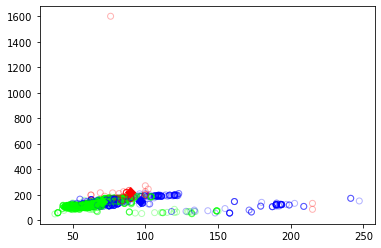

In [31]:
clusters3 = runKMeans(3, "encoded_smartphone_data.csv")

In [32]:
#3 components to std data
pca_applied_std3 = PCA_scratch(df_std[:,0:149], 3)

sorted eigenvectors 
 [[-8.47296152e-02 -7.11626930e-02  7.52371472e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.64759528e-01 -1.08514478e-01  3.56770710e-02 ...  5.79146371e-17
   3.01992180e-16 -4.09006847e-17]
 [ 1.35917750e-01  2.41370661e-01  5.53479654e-02 ...  2.47077561e-17
  -2.53540478e-16 -2.40560259e-17]
 ...
 [-4.50407522e-02  1.14982739e-01 -1.14438084e-01 ...  7.69981746e-02
  -2.08066628e-02  8.58249596e-03]
 [ 3.52916986e-02  2.79799476e-02  1.59335943e-02 ...  1.93565693e-02
  -5.23058647e-03  2.15755346e-03]
 [ 3.59989344e-02 -1.21443661e-01  1.09913978e-01 ...  7.73614425e-02
  -2.09048261e-02  8.62298711e-03]]

 shape of X_reduced: (13569, 3)


In [33]:
clusters3

,Unnamed: 0,Brand,Model,Added,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,...,ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary,Rank
0,0,ZTE,Blade 20 Smart Global TD-LTE 128GB,1/1/2020 12:55,76.6,162.91,8.95,111686.20870,14,0,...,0,0,0,0,0,1,0,0,1,2
1,1,Samsung,SM-G6200 Galaxy A6s Dual SIM TD-LTE CN 128GB,11/7/2018 22:32,76.5,156.30,8.40,100438.38000,21,0,...,0,0,0,0,0,1,0,0,1,2
2,2,LG,LMV450VMB V50 ThinQ 5G TD-LTE US V450VMB,3/5/2019 23:31,76.1,159.20,8.30,100555.49600,20,0,...,0,0,1,0,0,0,1,0,0,2
3,3,Huawei,Y5 Lite 2018 Dual SIM LTE LATAM CAG-LX3 / CAG-L23,5/10/2018 20:11,73.7,145.10,9.45,101057.07150,12,0,...,0,0,0,0,0,1,0,0,1,2
4,4,Nokia,4.2 Dual SIM TD-LTE AM 32GB,8/14/2019 15:07,71.3,148.95,8.39,89102.93265,21,0,...,0,0,0,0,0,1,1,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,13938,Samsung,SGH-i780,9/22/2007 23:57,61.3,115.90,12.90,91650.24300,4,0,...,0,0,0,0,0,1,1,0,0,2
13565,13939,Vodafone,VPA Compact GPS,1/31/2007 13:51,58.2,108.00,18.40,115655.04000,7,0,...,0,0,0,0,0,1,1,0,0,2
13566,13940,E-TEN,InfoTouch P603,4/3/2005 18:03,82.0,137.40,18.40,207309.12000,3,0,...,0,0,0,0,0,1,1,0,0,3
13567,13941,Airis,T482,8/15/2008 18:05,62.0,125.00,14.00,108500.00000,4,0,...,0,0,0,0,0,1,1,0,0,2


In [34]:
rank3 = pd.DataFrame(clusters3["Rank"])
rank3

,Rank
0,2
1,2
2,2
3,2
4,2
...,...
13564,2
13565,2
13566,3
13567,2


In [35]:
principal_df_std3 = pd.DataFrame(pca_applied_std3, columns=['PC1', 'PC2', 'PC3'])
principal_df_std3

,PC1,PC2,PC3
0,-1.987140,-1.732866,-2.240916
1,-0.589256,-1.916057,-0.507192
2,-9.134533,3.405869,0.309229
3,1.755422,-2.009945,0.191335
4,-1.075646,-1.008291,0.100118
...,...,...,...
13564,3.551819,3.769908,-1.048941
13565,3.980731,5.920419,-0.677992
13566,4.420406,9.298817,1.716738
13567,4.730529,6.959521,-1.275756


In [36]:
principal_df3 = pd.concat([principal_df_std3, rank3], axis=1)
principal_df3

,PC1,PC2,PC3,Rank
0,-1.987140,-1.732866,-2.240916,2
1,-0.589256,-1.916057,-0.507192,2
2,-9.134533,3.405869,0.309229,2
3,1.755422,-2.009945,0.191335,2
4,-1.075646,-1.008291,0.100118,2
...,...,...,...,...
13564,3.551819,3.769908,-1.048941,2
13565,3.980731,5.920419,-0.677992,2
13566,4.420406,9.298817,1.716738,3
13567,4.730529,6.959521,-1.275756,2


In [37]:
#graph pca with 3 components
fig = px.scatter_3d(principal_df3, x="PC1", y="PC2", z="PC3", color = "Rank")
fig.show()

### Use PCA library to confirm results

In [38]:
from sklearn.decomposition import PCA

In [39]:
df

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,61.3,115.90,12.90,91650.24300,4,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13565,58.2,108.00,18.40,115655.04000,7,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13566,82.0,137.40,18.40,207309.12000,3,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13567,62.0,125.00,14.00,108500.00000,4,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [40]:
X_std = StandardScaler().fit_transform(df)
X_std

array([[ 0.41242994,  0.94045379, -0.28238669, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.40422248,  0.64342397, -0.41266869, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.37139264,  0.77373963, -0.43635633, ...,  1.17869806,
        -0.12598344, -1.14164096],
       ...,
       [ 0.85563274, -0.2058746 ,  1.95609499, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.78585911, -0.76308636,  0.91383897, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.15388475, -1.12257782,  1.86134444, ...,  1.17869806,
        -0.12598344, -1.14164096]])

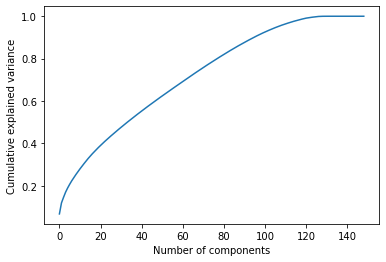

In [41]:
#choose number of components
pca = PCA().fit(X_std)
                
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

plt.show()

We can use the variance ratio to determine how many components are necessary to describe the data.

This curve quantifies how much of the total 149-dimensional variance is contained within the first N components. We see that we require around 40 components to describe 50% of the variance, and around 120 components to describe approximately 100% of the variance. 

Ultimately, we note that by projecting into a 2-dimensional space, we lose a lot of information and an estimated 100 components to retain 90% of the variance.

Source: https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html

In [42]:
pca_std = PCA(n_components=2)
Y_2sklearn_std = pca_std.fit_transform(X_std)

principal_df2_std = pd.DataFrame(data = Y_2sklearn_std, columns = ['PC1', 'PC2'])
principal_df2_std
# print("shape of y_sklearn:", Y_sklearn.shape)
# Y_sklearn

,PC1,PC2
0,1.987143,-1.732914
1,0.589258,-1.916103
2,9.134536,3.405480
3,-1.755422,-2.009866
4,1.075647,-1.008156
...,...,...
13564,-3.551829,3.769790
13565,-3.980740,5.920306
13566,-4.420399,9.298867
13567,-4.730532,6.959551


In [43]:
pca_2 = pd.concat([principal_df2_std, rank], axis=1)
pca_2

,PC1,PC2,Rank
0,1.987143,-1.732914,1
1,0.589258,-1.916103,1
2,9.134536,3.405480,1
3,-1.755422,-2.009866,1
4,1.075647,-1.008156,1
...,...,...,...
13564,-3.551829,3.769790,1
13565,-3.980740,5.920306,1
13566,-4.420399,9.298867,1
13567,-4.730532,6.959551,1


In [44]:
fig2_std = px.scatter(pca_2, x="PC1", y="PC2", color = "Rank")
fig2_std.show()

In [45]:
#pca with 3 components - using library
sklearn_pca_std = PCA(n_components=3)
Y_sklearn_std = sklearn_pca_std.fit_transform(X_std)

principal_df3_std = pd.DataFrame(data = Y_sklearn_std, columns = ['PC1', 'PC2', 'PC3'])
principal_df3_std
# print("shape of y_sklearn:", Y_sklearn.shape)
# Y_sklearn

,PC1,PC2,PC3
0,1.987132,-1.732953,-2.231788
1,0.589244,-1.916108,-0.501530
2,9.134574,3.406087,0.287457
3,-1.755423,-2.009937,0.190878
4,1.075656,-1.008158,0.089195
...,...,...,...
13564,-3.551825,3.769897,-1.052778
13565,-3.980731,5.920418,-0.679843
13566,-4.420401,9.298811,1.722053
13567,-4.730516,6.959555,-1.277251


In [46]:
pca_3 = pd.concat([principal_df3_std, rank3], axis=1)
pca_3

,PC1,PC2,PC3,Rank
0,1.987132,-1.732953,-2.231788,2
1,0.589244,-1.916108,-0.501530,2
2,9.134574,3.406087,0.287457,2
3,-1.755423,-2.009937,0.190878,2
4,1.075656,-1.008158,0.089195,2
...,...,...,...,...
13564,-3.551825,3.769897,-1.052778,2
13565,-3.980731,5.920418,-0.679843,2
13566,-4.420401,9.298811,1.722053,3
13567,-4.730516,6.959555,-1.277251,2


In [47]:
fig_std = px.scatter_3d(pca_3, x="PC1", y="PC2", z="PC3", color = "Rank")
fig_std.show()

### PCA with 3 principal components and 6 clusters colors

[4, 4, 4, 4, 1, 4, 4, 4, 1, 1, 1, 4, 4, 4, 4, 4, 4, 1, 4, 1, 1, 1, 1, 4, 1, 4, 6, 4, 4, 4, 4, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 1, 4, 1, 4, 1, 4, 4, 1, 4, 4, 6, 1, 4, 4, 1, 4, 1, 1, 4, 4, 1, 4, 4, 1, 1, 4, 4, 4, 1, 4, 4, 1, 1, 4, 6, 1, 4, 1, 1, 4, 4, 4, 1, 1, 1, 1, 4, 4, 1, 4, 1, 4, 4, 4, 4, 1, 4, 4, 4, 1, 4, 1, 4, 4, 1, 4, 6, 4, 4, 4, 4, 1, 1, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, 1, 6, 4, 4, 4, 4, 1, 4, 1, 1, 4, 1, 1, 4, 1, 1, 4, 1, 4, 1, 4, 1, 1, 1, 6, 4, 2, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 6, 4, 4, 4, 4, 4, 6, 4, 1, 4, 4, 1, 4, 1, 4, 4, 4, 1, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 1, 1, 1, 4, 4, 4, 4, 4, 4, 4, 1, 4, 1, 4, 1, 4, 4, 4, 4, 1, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 4, 1, 4, 4, 4, 1, 4, 4, 1, 4, 1, 4, 4, 1, 1, 4, 4, 4, 4, 1, 1, 1, 4, 4, 4, 4, 4, 1, 1, 1, 4, 4, 4, 6, 4, 6, 4, 4, 4, 4, 1, 1, 1, 4, 4, 4, 4, 4, 1, 4, 4, 4, 1, 1, 6, 4, 4, 1, 4, 4, 1, 1, 4, 6, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 1, 4, 4, 4, 1, 1, 1, 4, 4, 1, 4, 4, 1, 4, 1, 4, 1, 4, 4, 4, 1, 4, 4, 4, 4, 4, 6, 1, 4, 4, 

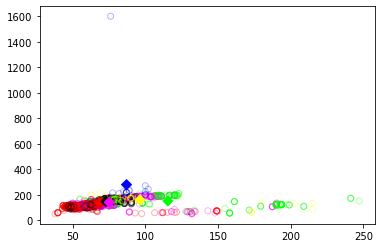

In [48]:
clusters6 = runKMeans(6,"encoded_smartphone_data.csv")

In [50]:
clusters6

,Unnamed: 0,Brand,Model,Added,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,...,ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary,Rank
0,0,ZTE,Blade 20 Smart Global TD-LTE 128GB,1/1/2020 12:55,76.6,162.91,8.95,111686.20870,14,0,...,0,0,0,0,0,1,0,0,1,4
1,1,Samsung,SM-G6200 Galaxy A6s Dual SIM TD-LTE CN 128GB,11/7/2018 22:32,76.5,156.30,8.40,100438.38000,21,0,...,0,0,0,0,0,1,0,0,1,4
2,2,LG,LMV450VMB V50 ThinQ 5G TD-LTE US V450VMB,3/5/2019 23:31,76.1,159.20,8.30,100555.49600,20,0,...,0,0,1,0,0,0,1,0,0,4
3,3,Huawei,Y5 Lite 2018 Dual SIM LTE LATAM CAG-LX3 / CAG-L23,5/10/2018 20:11,73.7,145.10,9.45,101057.07150,12,0,...,0,0,0,0,0,1,0,0,1,4
4,4,Nokia,4.2 Dual SIM TD-LTE AM 32GB,8/14/2019 15:07,71.3,148.95,8.39,89102.93265,21,0,...,0,0,0,0,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,13938,Samsung,SGH-i780,9/22/2007 23:57,61.3,115.90,12.90,91650.24300,4,0,...,0,0,0,0,0,1,1,0,0,1
13565,13939,Vodafone,VPA Compact GPS,1/31/2007 13:51,58.2,108.00,18.40,115655.04000,7,0,...,0,0,0,0,0,1,1,0,0,4
13566,13940,E-TEN,InfoTouch P603,4/3/2005 18:03,82.0,137.40,18.40,207309.12000,3,0,...,0,0,0,0,0,1,1,0,0,2
13567,13941,Airis,T482,8/15/2008 18:05,62.0,125.00,14.00,108500.00000,4,0,...,0,0,0,0,0,1,1,0,0,4


In [55]:
rank6 = pd.DataFrame(clusters6["Rank"])
rank6

,Rank
0,4
1,4
2,4
3,4
4,1
...,...
13564,1
13565,4
13566,2
13567,4


In [56]:
principal_df_std3_6 = pd.DataFrame(pca_applied_std3, columns=['PC1', 'PC2', 'PC3'])
principal_df_std3_6

,PC1,PC2,PC3
0,-1.987140,-1.732866,-2.240916
1,-0.589256,-1.916057,-0.507192
2,-9.134533,3.405869,0.309229
3,1.755422,-2.009945,0.191335
4,-1.075646,-1.008291,0.100118
...,...,...,...
13564,3.551819,3.769908,-1.048941
13565,3.980731,5.920419,-0.677992
13566,4.420406,9.298817,1.716738
13567,4.730529,6.959521,-1.275756


In [57]:
principal_df3_6 = pd.concat([principal_df_std3_6, rank6], axis=1)
principal_df3_6

,PC1,PC2,PC3,Rank
0,-1.987140,-1.732866,-2.240916,4
1,-0.589256,-1.916057,-0.507192,4
2,-9.134533,3.405869,0.309229,4
3,1.755422,-2.009945,0.191335,4
4,-1.075646,-1.008291,0.100118,1
...,...,...,...,...
13564,3.551819,3.769908,-1.048941,1
13565,3.980731,5.920419,-0.677992,4
13566,4.420406,9.298817,1.716738,2
13567,4.730529,6.959521,-1.275756,4


In [58]:
#graph pca with 3 principal components and 6 cluster colors
fig = px.scatter_3d(principal_df3_6, x="PC1", y="PC2", z="PC3", color = "Rank")
fig.show()

### Graphing with Data Subsets

In [59]:
def plot_random_subset_count(data, sample_size):
    
    new_data = []
    k = max(data['Rank']) + 1
    for i in range(k):
        subset = data[data['Rank'] == i]
        subset = subset.sample(n = sample_size)
        new_data.append(pd.DataFrame(subset))
        
    
    df = pd.DataFrame(new_data[0])
    for i in range(1,k):
        df = df.append(pd.DataFrame(new_data[i]))
        
    plt.scatter(df.iloc[:,0],df.iloc[:,1],c=df['Rank'])
    plt.show()

In [60]:
def plot_random_subset_percent(data, sample_percent):
    
    new_data = []
    k = max(data['Rank']) + 1
    for i in range(k):
        subset = data[data['Rank'] == i]
        subset = subset.sample(frac = sample_percent)
        new_data.append(pd.DataFrame(subset))
        
    
    df = pd.DataFrame(new_data[0])
    for i in range(1,k):
        df = df.append(pd.DataFrame(new_data[i]))
        
    plt.scatter(df.iloc[:,0],df.iloc[:,1],c=df['Rank'])
    plt.show()

In [63]:
plot_random_subset_count(pca_2, 5)

ValueError: a must be greater than 0 unless no samples are taken